<a href="https://colab.research.google.com/github/grojasc/MIA/blob/main/Practico_3_YOLO_GR.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# MIA UC (Magíster en Inteligencia Artificial)
## Práctico YOLO - curso Aplicaciones
**Lunes 12 de Junio de 2023**


YOLO es una red de detección y clasificación de objetos por regiones propuestas. Es decir, la red toma una imagen y entrega propuestas de regiones en donde cree haber encontrado un objeto que es capaz de clasificar.

Darknet YOLO es más rápido y más preciso que las redes neuronales en tiempo real de Google TensorFlow EfficientDet y FaceBook Pytorch/Detectron RetinaNet/MaskRCNN en cuanto a la detección de objetos particulares que se encuentran en el dataset de [COCO](https://cocodataset.org/#home).

Un ejemplo de la aplicación real de YOLO es posible verlo aquí: [YOLOv4 - The most accurate real-time neural network for object detection](https://www.youtube.com/watch?v=1_SiUOYUoOI&feature=youtu.be).

In [1]:
from IPython.display import display, Javascript, Image
from google.colab.output import eval_js
from google.colab.patches import cv2_imshow
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io
import html
import time
import matplotlib.pyplot as plt
import argparse
import os
import sys
import glob
import random
import time
from random import randint
import xml.etree.ElementTree as ET
from google.colab.patches import cv2_imshow
%matplotlib inline

In [ ]:
!git clone https://github.com/AlexeyAB/darknet

Cloning into 'darknet'...
remote: Enumerating objects: 15521, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 15521 (delta 0), reused 4 (delta 0), pack-reused 15514
Receiving objects: 100% (15521/15521), 14.17 MiB | 15.86 MiB/s, done.
Resolving deltas: 100% (10413/10413), done.


In [ ]:
# Cambia al directorio 'darknet'
%cd darknet
# Habilita OpenCV en el Makefile
!sed -i 's/OPENCV=0/OPENCV=1/' Makefile
# Habilita la GPU en el Makefile
!sed -i 's/GPU=0/GPU=1/' Makefile
# Habilita cuDNN en el Makefile
!sed -i 's/CUDNN=0/CUDNN=1/' Makefile
!sed -i 's/CUDNN_HALF=0/CUDNN_HALF=1/' Makefile
!sed -i 's/LIBSO=0/LIBSO=1/' Makefile
#En resumen, estas líneas de código modifican el archivo Makefile de Darknet para habilitar opciones como OpenCV, GPU, cuDNN

/content/darknet


In [ ]:
#compilamos darknet (que esta en C)
!make

mkdir -p ./obj/
mkdir -p backup
chmod +x *.sh
g++ -std=c++11 -std=c++11 -Iinclude/ -I3rdparty/stb/include -DOPENCV `pkg-config --cflags opencv4 2> /dev/null || pkg-config --cflags opencv` -DGPU -I/usr/local/cuda/include/ -DCUDNN -DCUDNN_HALF -Wall -Wfatal-errors -Wno-unused-result -Wno-unknown-pragmas -fPIC -rdynamic -Ofast -DOPENCV -DGPU -DCUDNN -I/usr/local/cudnn/include -DCUDNN_HALF -fPIC -c ./src/image_opencv.cpp -o obj/image_opencv.o
./src/image_opencv.cpp: In function ‘void draw_detections_cv_v3(void**, detection*, int, float, char**, image**, int, int)’:
./src/image_opencv.cpp:946:23: warning: variable ‘rgb’ set but not used [-Wunused-but-set-variable]
  946 |                 float rgb[3];
      |                       ^~~
./src/image_opencv.cpp: In function ‘void draw_train_loss(char*, void**, int, float, float, int, int, float, int, char*, float, int, int, double)’:
./src/image_opencv.cpp:1147:13: warning: this ‘if’ clause does not guard... [-Wmisleading-indentation]
 1147 |  

In [ ]:
#descargamos los pesos de YOLO
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq" -O yolov4-csp.weights && rm -rf /tmp/cookies.txt

--2023-06-12 22:48:12--  https://docs.google.com/uc?export=download&confirm=t&id=1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq
Resolving docs.google.com (docs.google.com)... 172.217.194.113, 172.217.194.139, 172.217.194.102, ...
Connecting to docs.google.com (docs.google.com)|172.217.194.113|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-14-84-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/0n07c645q1lf49rkiahanrg6kmf5oele/1686610050000/17800843676226924807/*/1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq?e=download&uuid=babb6a61-237a-49b4-93ec-7153ddfdfe6f [following]
--2023-06-12 22:48:12--  https://doc-14-84-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/0n07c645q1lf49rkiahanrg6kmf5oele/1686610050000/17800843676226924807/*/1V3vsIaxAlGWvK4Aar9bAiK5U0QFttKwq?e=download&uuid=babb6a61-237a-49b4-93ec-7153ddfdfe6f
Resolving doc-14-84-docs.googleusercontent.com (doc-14-84-docs.googleusercontent.com)... 142.251.10.1

In [ ]:
#Descargamos algunas imagenes desde Drive que la red nunca ha visto para testear YOLO
!gdown 1A-QbvhIJI903PLaOfUHrjbkR056xIWj6
!unzip sesion2.zip
!wget https://github.com/mozanunal/yoloOnGoogleColab/raw/master/test/test.jpg

Downloading...
From: https://drive.google.com/uc?id=1A-QbvhIJI903PLaOfUHrjbkR056xIWj6
To: /content/darknet/sesion2.zip
100% 113M/113M [00:03<00:00, 35.9MB/s]
Archive:  sesion2.zip
  inflating: Sesión 2/vegetables-1085063_1920.jpg  
  inflating: Sesión 2/elephant-4929027_960_720.jpg  
  inflating: Sesión 2/zebra-1170177_960_720.jpg  
  inflating: Sesión 2/pedestrians-1853552_960_720.jpg  
  inflating: Sesión 2/berlin-7218821_960_720.jpg  
  inflating: Sesión 2/highway-2679490_960_720.jpg  
  inflating: Sesión 2/sheep-6554180_960_720.jpg  
  inflating: Sesión 2/roof-windows-2777582_960_720.jpg  
  inflating: Sesión 2/wines-1761613_960_720.jpg  
  inflating: Sesión 2/1634302579-huge.jpg  
  inflating: Sesión 2/shutterstock_2120325011.jpg  
  inflating: Sesión 2/shutterstock_443923171.jpg  
  inflating: Sesión 2/shutterstock_735819208.jpg  
  inflating: Sesión 2/shutterstock_1837802227.jpg  
  inflating: Sesión 2/shutterstock_1639933630.jpg  
  inflating: Sesión 2/shutterstock_1206985765.j

In [ ]:
!wget http://host.robots.ox.ac.uk/pascal/VOC/voc2012/VOCtrainval_11-May-2012.tar
!tar -xvf VOCtrainval_11-May-2012.tar

Se truncaron las últimas líneas 5000 del resultado de transmisión.
VOCdevkit/VOC2012/SegmentationClass/2008_001874.png
VOCdevkit/VOC2012/SegmentationClass/2008_001876.png
VOCdevkit/VOC2012/SegmentationClass/2008_001882.png
VOCdevkit/VOC2012/SegmentationClass/2008_001885.png
VOCdevkit/VOC2012/SegmentationClass/2008_001895.png
VOCdevkit/VOC2012/SegmentationClass/2008_001896.png
VOCdevkit/VOC2012/SegmentationClass/2008_001926.png
VOCdevkit/VOC2012/SegmentationClass/2008_001966.png
VOCdevkit/VOC2012/SegmentationClass/2008_001971.png
VOCdevkit/VOC2012/SegmentationClass/2008_001992.png
VOCdevkit/VOC2012/SegmentationClass/2008_001997.png
VOCdevkit/VOC2012/SegmentationClass/2008_002032.png
VOCdevkit/VOC2012/SegmentationClass/2008_002043.png
VOCdevkit/VOC2012/SegmentationClass/2008_002064.png
VOCdevkit/VOC2012/SegmentationClass/2008_002066.png
VOCdevkit/VOC2012/SegmentationClass/2008_002067.png
VOCdevkit/VOC2012/SegmentationClass/2008_002073.png
VOCdevkit/VOC2012/SegmentationClass/2008_002079.p

In [ ]:
import darknet
network, class_names, class_colors = darknet.load_network("cfg/yolov4-csp.cfg", "cfg/coco.data", "yolov4-csp.weights")

In [ ]:
# Podemos ver las clases con las cuales fue entrenado el modelo, estas clases perteneces al dataset COCO.
for i, class_name in enumerate(class_names):
    print(f'{i}) {class_name}')

0) person
1) bicycle
2) car
3) motorbike
4) aeroplane
5) bus
6) train
7) truck
8) boat
9) traffic light
10) fire hydrant
11) stop sign
12) parking meter
13) bench
14) bird
15) cat
16) dog
17) horse
18) sheep
19) cow
20) elephant
21) bear
22) zebra
23) giraffe
24) backpack
25) umbrella
26) handbag
27) tie
28) suitcase
29) frisbee
30) skis
31) snowboard
32) sports ball
33) kite
34) baseball bat
35) baseball glove
36) skateboard
37) surfboard
38) tennis racket
39) bottle
40) wine glass
41) cup
42) fork
43) knife
44) spoon
45) bowl
46) banana
47) apple
48) sandwich
49) orange
50) broccoli
51) carrot
52) hot dog
53) pizza
54) donut
55) cake
56) chair
57) sofa
58) pottedplant
59) bed
60) diningtable
61) toilet
62) tvmonitor
63) laptop
64) mouse
65) remote
66) keyboard
67) cell phone
68) microwave
69) oven
70) toaster
71) sink
72) refrigerator
73) book
74) clock
75) vase
76) scissors
77) teddy bear
78) hair drier
79) toothbrush


In [ ]:
# Esta función nos entrega una imagen aleatoria del dataset de Pascal VOC (y la despliega con el parámetro display=True)
def get_random_img_voc(display=False):
    tree = ET.parse(np.random.choice(glob.glob('VOCdevkit/VOC2012/Annotations/*.xml'), 1)[0])
    root = tree.getroot()
    filename = root.findall('filename')[0].text
    filepath = f'VOCdevkit/VOC2012/JPEGImages/{filename}'
    # Inicializar un diccionario para almacenar los objetos encontrados en la imagen
    objects = {}
    # Recorrer cada objeto anotado en el archivo XML
    for obj in root.findall('object'):
      # Obtener el nombre de la clase del objeto
        name = obj.findall('name')[0].text
         # Si es la primera aparición de la clase, inicializar una lista vacía en el diccionario
        if name not in objects:
            objects[name] = []
        boxes = obj.findall('bndbox')[0]
        # Obtener las coordenadas del cuadro delimitador (bounding box) del objeto
        objects[name].append([int(boxes.findall('xmin')[0].text),
                              int(boxes.findall('ymin')[0].text),
                              int(boxes.findall('xmax')[0].text),
                              int(boxes.findall('ymax')[0].text)])
    if display:
       # Mostrar la imagen con las anotaciones si el argumento display es True
        img = cv2.imread(filepath)
        img_h, img_w = img.shape[:2]
        print(img_h, img_w)
        colors = {}

        for obj_class in objects.keys():
          #para cada clase selecciono un color aleatorio
            if obj_class not in colors:
                colors[obj_class] = [randint(0, 255), randint(0, 255), randint(0, 255)]

            for obj in objects[obj_class]:
              #muestro los boxes en la imagen
                x_min = obj[0]
                y_min = obj[1]
                x_max = obj[2]
                y_max = obj[3]
                cv2.rectangle(img, (x_min, y_min), (x_max, y_max), color=colors[obj_class], thickness=2)
                cv2.putText(img, obj_class, (x_min, y_max), 1, 1, colors[obj_class])
        cv2_imshow(img)
    return filepath, objects

375 500


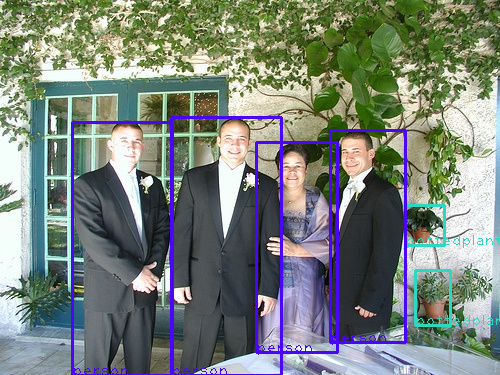

('VOCdevkit/VOC2012/JPEGImages/2007_003020.jpg',
 {'pottedplant': [[405, 205, 444, 245], [415, 270, 450, 325]],
  'person': [[72, 122, 172, 375],
   [171, 117, 281, 375],
   [256, 142, 337, 352],
   [330, 130, 405, 342]]})

In [ ]:
# Hacemos llamada a la función y observamos que nos entrega una imagen con bounding boxes y etiquetas en los objetos relevantes
# Recordamos que aun no hemos testeado la red YOLO, los objetos que se muestran en la imagen son los que vienen en el
# dataset original como "ground truth"

# Puede volver a ejecutar la celda para obtener nuevas imagenes
get_random_img_voc(True)

In [ ]:
# Para desplegar las imágenes que descargamos del Drive, generamos la función load_images() que desplegará una imagen
# con extensión .jpg, .png o .jpeg

def load_images(images_path):
    """
    If image path is given, return it directly
    For txt file, read it and return each line as image path
    In other case, it's a folder, return a list with names of each
    jpg, jpeg and png file
    """
    input_path_extension = images_path.split('.')[-1]
    if input_path_extension in ['jpg', 'jpeg', 'png']:
        return [images_path]
    elif input_path_extension == "txt":
        with open(images_path, "r") as f:
            return f.read().splitlines()
    else:
        return glob.glob(
            os.path.join(images_path, "*.jpg")) + \
            glob.glob(os.path.join(images_path, "*.png")) + \
            glob.glob(os.path.join(images_path, "*.jpeg"))

In [ ]:
# Esta es la función que recibe una imagen y genera las bounding boxes de acuerdo a lo encontrado por la red YOLO.
def image_detection(image_or_path, network, class_names, class_colors, thresh):
    # Obtiene las dimensiones de la red
    width = darknet.network_width(network)
    height = darknet.network_height(network)
    # Crea una imagen de Darknet con las dimensiones de la red
    darknet_image = darknet.make_image(width, height, 3)
    # Lee la imagen utilizando OpenCV
    image = cv2.imread(image_or_path)
    # Obtiene las dimensiones de la imagen
    image_height, image_width, _ = image.shape
    # Calcula las relaciones de escala entre la imagen y la red
    width_ratio = image_width / width
    height_ratio = image_height / height
    # Convierte la imagen de BGR a RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Redimensiona la imagen a las dimensiones de la red
    image_resized = cv2.resize(image_rgb, (width, height),
                               interpolation=cv2.INTER_LINEAR)
    # Copia la imagen redimensionada a la imagen de Darknet
    darknet.copy_image_from_bytes(darknet_image, image_resized.tobytes())
    # Realiza la detección de objetos en la imagen
    detections = darknet.detect_image(network, class_names, darknet_image, thresh=thresh)
    # Libera la memoria de la imagen de Darknet
    darknet.free_image(darknet_image)
    image = darknet.draw_boxes(detections, image_resized, class_colors)
    # Devuelve la imagen con las cajas delimitadoras, las detecciones y las relaciones de escala
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB), detections, width_ratio, height_ratio

In [ ]:
# Se genera un diccionario que entrega los objetos detectados con sus bounding boxes para luego imprimirlas y analizarlas.
def get_bboxes_from_detections(detections, width_ratio, height_ratio):
  # Crea un diccionario para almacenar los objetos detectados con sus bounding boxes
    objects = {}
    # Itera sobre las detecciones
    for detection in detections:
      # Verifica si el nombre de la clase ya existe en el diccionario, si no existe, lo inicializa
        if detection[0] not in objects:
            objects[detection[0]] = []
            # Obtiene las coordenadas de la bounding box en el formato (left, top, right, bottom)
        left, top, right, bottom = darknet.bbox2points(detection[2])
        # Ajusta las coordenadas de la bounding box utilizando las relaciones de escala
        left, top, right, bottom = int(left * width_ratio), int(top * height_ratio), int(right * width_ratio), int(
            bottom * height_ratio)
        # Agrega las coordenadas de la bounding box al diccionario de objetos detectados
        objects[detection[0]].append([left, top, right, bottom])
        # Devuelve el diccionario de objetos detectados con sus bounding boxes
    return objects

In [ ]:
# Finalmente se genera la función que recibe una imagen y, usando las dos funciones anteriores, despliega la imagen con
# las bounding boxes encontrada y el diccionario con las coordenadas de las cajas.
# Si no se le entrega un path de la imagen, se utiliza una imagen aleatoria del dataset Pascal VOC.

# El parámetro threshold define el umbral con el cual se decide si el objeto encontrado se acepta o no, ya que YOLO entrega una probabilidad
# de que se encuentre el objeto dentro de la caja

def predictImage(image_path=None, threshold=0.5):
    objects = None
    # Verifica si se proporcionó una ruta de imagen. Si no, se obtiene una imagen aleatoria del dataset de Pascal VOC
    if image_path is None:
        image_path, objects = get_random_img_voc()
    print(image_path)
     # Imprime la ruta de la imagen
    images = load_images(image_path)
    image_name = images[0]
    # Realiza la detección de objetos en la imagen y obtiene las detecciones y las relaciones de escala
    image, detections, width_ratio, height_ratio = image_detection(image_name, network, class_names, class_colors, threshold)
      # Convierte las detecciones en bounding boxes ajustadas utilizando las relaciones de escala
    detections = get_bboxes_from_detections(detections, width_ratio, height_ratio)
     # Muestra la imagen con las bounding boxes dibujadas
    cv2_imshow(image)
    # Devuelve las detecciones y los objetos obtenidos (si se proporcionaron aleatoriamente)
    return detections, objects

VOCdevkit/VOC2012/JPEGImages/2012_000617.jpg


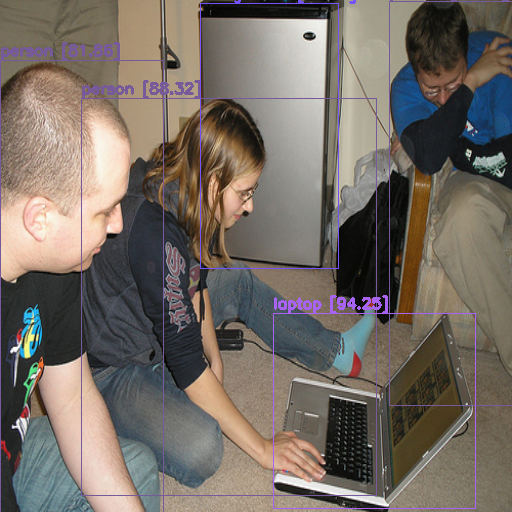

({'person': [[379, 0, 500, 296], [0, 43, 159, 376], [79, 71, 367, 362]],
  'refrigerator': [[195, 2, 330, 196]],
  'laptop': [[266, 229, 463, 372]]},
 {'person': [[86, 73, 369, 358]]})

In [ ]:
# Si llamamos a la función anterior sin ningún parámetro, entregará una imagen aleatoria del dataset Pascal VOC con las cajas detectadas por YOLO
predictImage()

./Sesión 2/vegetables-1085063_1920.jpg
./Sesión 2/vegetables-1085063_1920.jpg


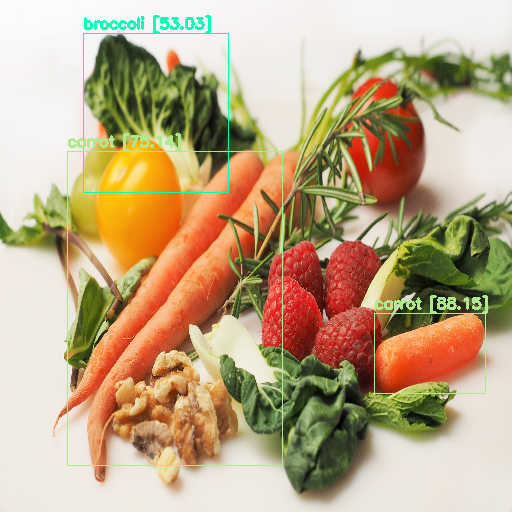

({'broccoli': [[311, 81, 855, 475]], 'carrot': [[251, 373, 1057, 1151], [1402, 775, 1818, 973]]}, None)
./Sesión 2/berlin-7218821_960_720.jpg
./Sesión 2/berlin-7218821_960_720.jpg


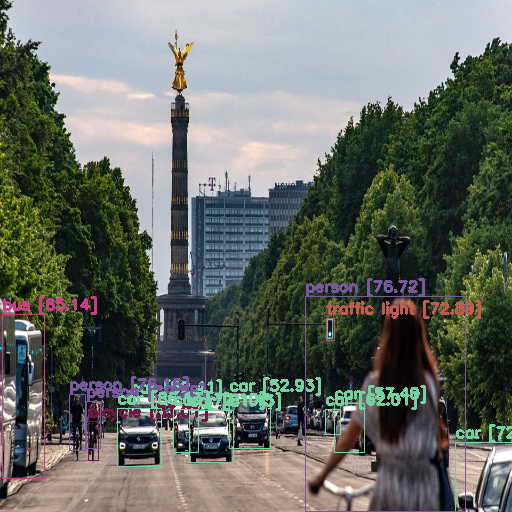

({'car': [[243, 473, 292, 492], [429, 471, 506, 534], [626, 480, 682, 539], [609, 488, 637, 517], [324, 488, 371, 539], [853, 527, 960, 611], [354, 489, 436, 551], [219, 486, 301, 556]], 'bicycle': [[165, 502, 183, 548]], 'person': [[161, 478, 187, 534], [129, 470, 159, 537], [571, 353, 871, 609]], 'bus': [[3, 374, 82, 570]], 'traffic light': [[611, 379, 626, 405]]}, None)
./Sesión 2/1634302579-huge.jpg
./Sesión 2/1634302579-huge.jpg


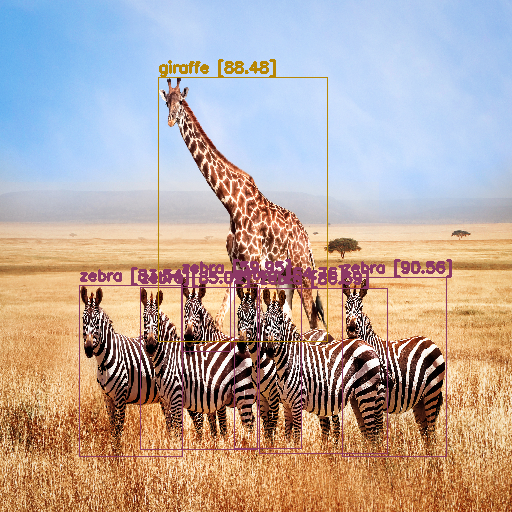

({'zebra': [[1508, 1539, 1916, 1950], [1950, 1572, 2508, 2489], [658, 1583, 1516, 2533], [1166, 1594, 2141, 2494], [2158, 1600, 3225, 2517], [2850, 1539, 3716, 2533]], 'giraffe': [[1316, 427, 2725, 1894]]}, None)
./Sesión 2/shutterstock_1206985765.jpg
./Sesión 2/shutterstock_1206985765.jpg


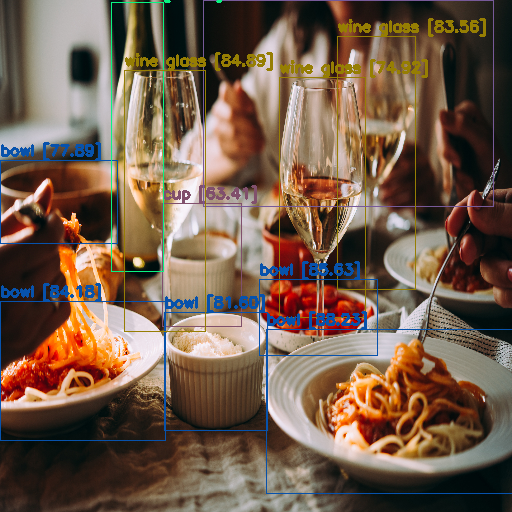

({'cup': [[1423, 1190, 2118, 1912]], 'wine glass': [[2452, 451, 3208, 1859], [2961, 211, 3647, 1695], [1089, 410, 1801, 1941]], 'person': [[1784, 0, 4333, 1208]], 'bowl': [[0, 938, 1028, 1425], [1441, 1829, 2346, 2522], [0, 1765, 1450, 2580], [2276, 1636, 3313, 2082], [2337, 1929, 4500, 2891]], 'bottle': [[975, 11, 1432, 1589]]}, None)
./Sesión 2/zebra-1170177_960_720.jpg
./Sesión 2/zebra-1170177_960_720.jpg


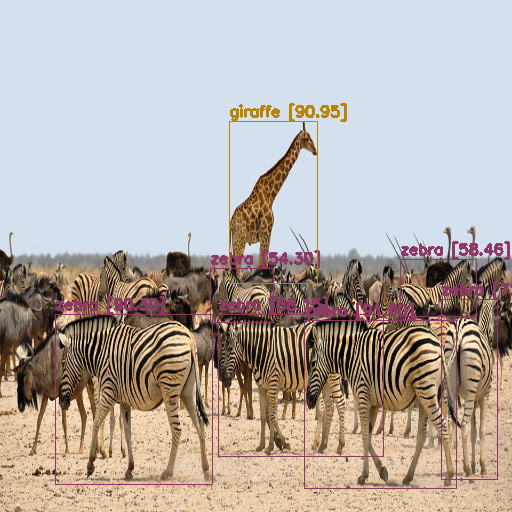

({'zebra': [[393, 282, 511, 338], [750, 272, 892, 332], [408, 330, 718, 480], [826, 314, 931, 504], [103, 330, 397, 509], [570, 336, 855, 513]], 'giraffe': [[429, 127, 594, 297]]}, None)
./Sesión 2/shutterstock_1639933630.jpg
./Sesión 2/shutterstock_1639933630.jpg


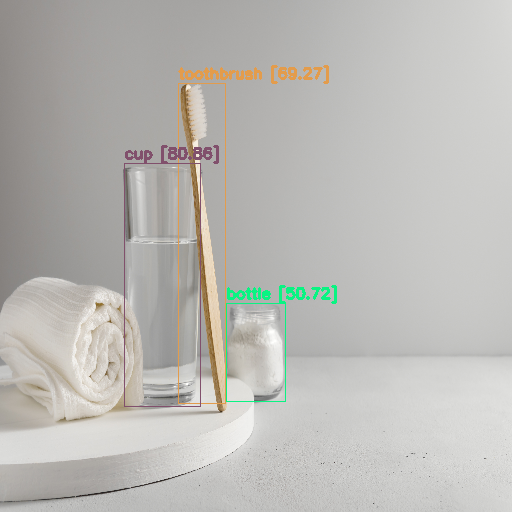

({'bottle': [[2625, 2346, 3310, 3105]], 'toothbrush': [[2067, 642, 2613, 3120]], 'cup': [[1440, 1262, 2323, 3144]]}, None)
./Sesión 2/highway-2679490_960_720.jpg
./Sesión 2/highway-2679490_960_720.jpg


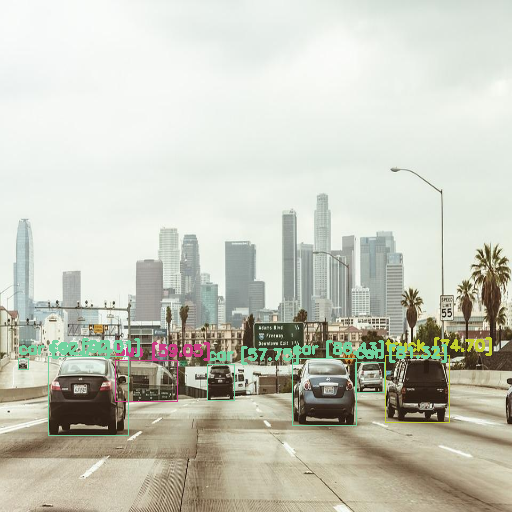

({'car': [[388, 455, 438, 500], [33, 447, 52, 461], [665, 452, 720, 490], [547, 447, 667, 531], [90, 445, 240, 543]], 'bus': [[215, 450, 331, 501]], 'truck': [[721, 443, 841, 527]]}, None)
./Sesión 2/shutterstock_2061005048.jpg
./Sesión 2/shutterstock_2061005048.jpg


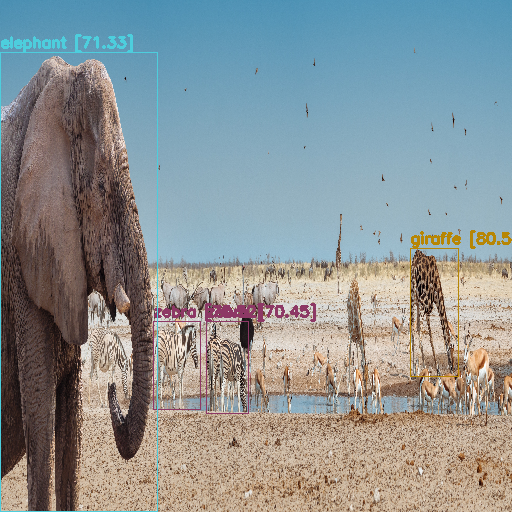

({'zebra': [[3933, 1874, 4735, 2411], [2921, 1874, 3819, 2388]], 'elephant': [[0, 303, 2998, 2984]], 'giraffe': [[7829, 1448, 8745, 2195]]}, None)
./Sesión 2/roof-windows-2777582_960_720.jpg
./Sesión 2/roof-windows-2777582_960_720.jpg


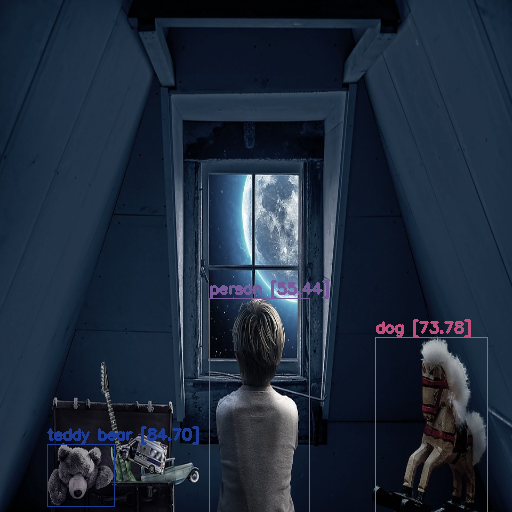

({'person': [[391, 372, 579, 640]], 'dog': [[703, 421, 913, 640]], 'teddy bear': [[88, 555, 213, 632]]}, None)
./Sesión 2/wines-1761613_960_720.jpg
./Sesión 2/wines-1761613_960_720.jpg


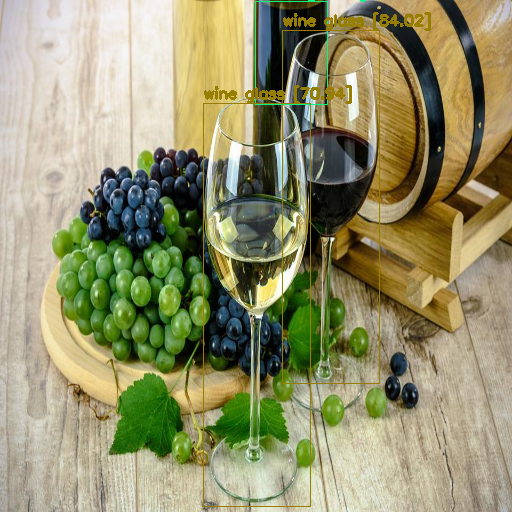

({'bottle': [[478, 1, 613, 130]], 'wine glass': [[380, 128, 581, 632], [528, 37, 710, 478]]}, None)
./Sesión 2/shutterstock_443923171.jpg
./Sesión 2/shutterstock_443923171.jpg


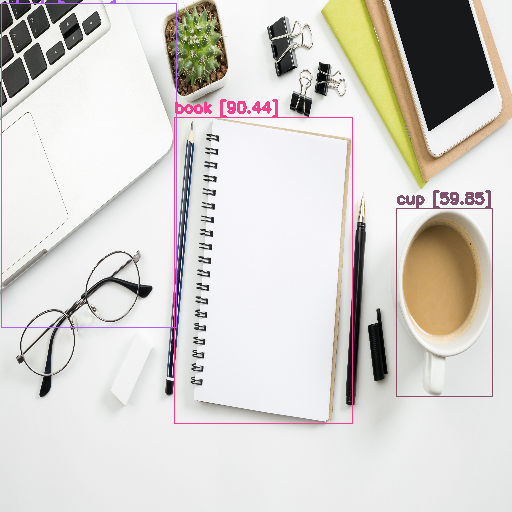

({'laptop': [[7, 15, 1346, 1667]], 'cup': [[3029, 1060, 3763, 2019]], 'book': [[1331, 596, 2692, 2157]]}, None)
./Sesión 2/shutterstock_735819208.jpg
./Sesión 2/shutterstock_735819208.jpg


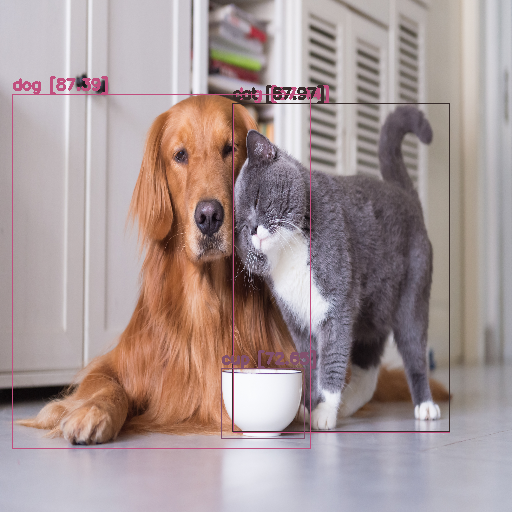

({'dog': [[2132, 627, 4109, 2631], [109, 572, 2837, 2729]], 'cat': [[2123, 627, 4109, 2625]], 'cup': [[2022, 2241, 2782, 2668]]}, None)
./Sesión 2/shutterstock_1837802227.jpg
./Sesión 2/shutterstock_1837802227.jpg


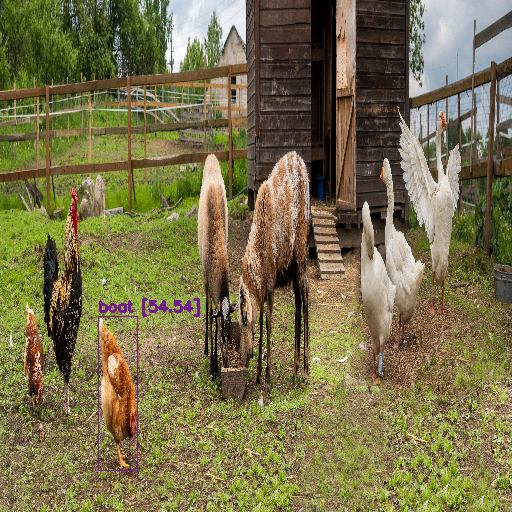

({'boat': [[1722, 1444, 2408, 2148]]}, None)
./Sesión 2/sheep-6554180_960_720.jpg
./Sesión 2/sheep-6554180_960_720.jpg


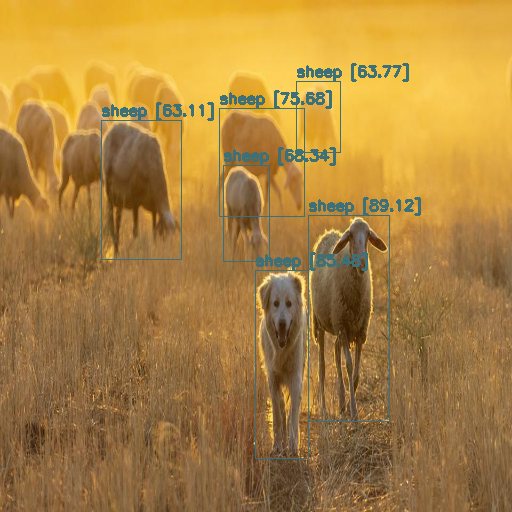

({'sheep': [[189, 128, 339, 276], [555, 86, 637, 162], [418, 176, 504, 278], [410, 115, 570, 230], [478, 288, 577, 489], [577, 229, 729, 449]]}, None)
./Sesión 2/shutterstock_2120325011.jpg
./Sesión 2/shutterstock_2120325011.jpg


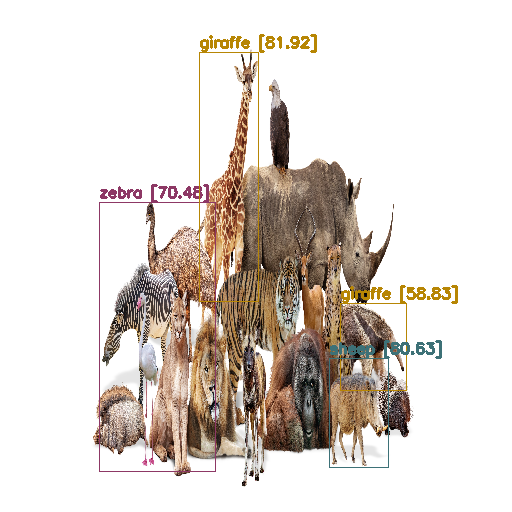

({'giraffe': [[6975, 2365, 8330, 3044], [4082, 405, 5293, 2349]], 'zebra': [[2031, 1576, 4411, 3676]], 'sheep': [[6750, 2794, 7960, 3645]]}, None)
./Sesión 2/elephant-4929027_960_720.jpg
./Sesión 2/elephant-4929027_960_720.jpg


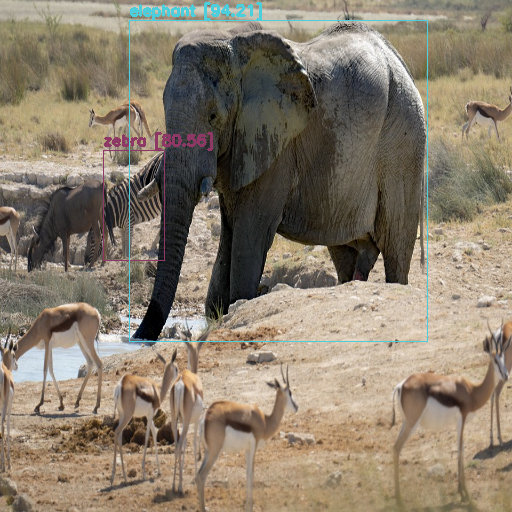

({'zebra': [[193, 184, 307, 319]], 'elephant': [[241, 24, 800, 418]]}, None)
./Sesión 2/pedestrians-1853552_960_720.jpg
./Sesión 2/pedestrians-1853552_960_720.jpg


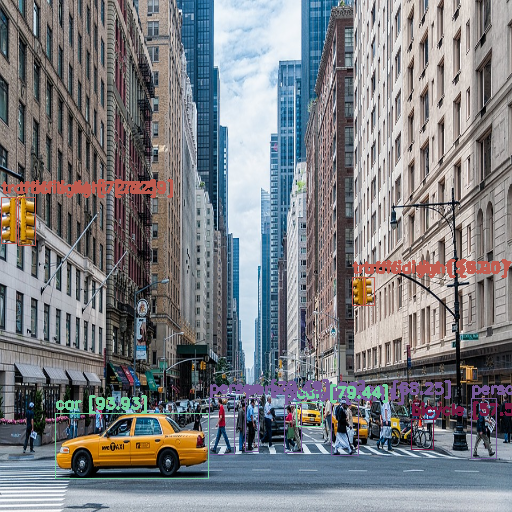

({'person': [[459, 495, 483, 561], [532, 502, 564, 562], [620, 495, 671, 566], [883, 495, 930, 569], [391, 493, 438, 564]], 'bicycle': [[770, 521, 811, 558]], 'traffic light': [[660, 344, 684, 379], [680, 344, 701, 379], [33, 245, 65, 304], [1, 245, 30, 302]], 'car': [[555, 500, 603, 530], [103, 513, 390, 594]]}, None)
./Sesión 2/shutterstock_1010722123.jpg
./Sesión 2/shutterstock_1010722123.jpg


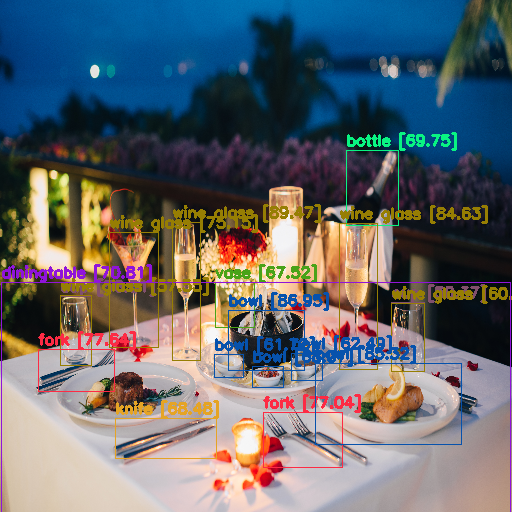

({'cup': [[4559, 2351, 4944, 2888], [699, 2304, 1061, 2841]], 'wine glass': [[699, 2296, 1061, 2841], [4559, 2358, 4944, 2888], [1271, 1806, 1842, 2701], [3953, 1736, 4396, 2872], [2005, 1728, 2332, 2802]], 'bowl': [[2495, 2755, 2833, 2935], [3393, 2748, 3755, 2958], [2938, 2849, 3300, 3012], [3673, 2826, 5376, 3456], [2658, 2413, 3545, 2880]], 'vase': [[2507, 2195, 2962, 2545]], 'knife': [[1341, 3254, 2519, 3565]], 'bottle': [[4035, 1167, 4641, 1751]], 'diningtable': [[11, 2195, 5947, 3986]], 'fork': [[3067, 3207, 3988, 3635], [443, 2717, 1329, 3043]]}, None)


In [ ]:
for path in glob.glob("./Sesión 2/*.jpg"):
    print(path)
    print(predictImage(path, 0.5))

## Actividad 1

Utilice la función `predictImage` para una o más de las imágenes anteriores (el path de estas está impreso) y pruebe distintos valores del parámetro `threshold`.

- ¿Cómo afecta este parámetro en los objetos detectados?
- ¿Qué pasa con valores muy altos?
- ¿Y con valores muy bajos?

In [ ]:
# Código aquí
# predictImage(path, threshold)

## Métrica de Rendimiento

Cuando evaluamos la detección de objetos o clases es extremadamente díficil que un algoritmo prediga con exactitud las coordenadas (x,y) en donde se enmarca el objeto y que estas a su vez coincidan con el ground truth.

Es por lo mismo, que YOLO utiliza la métrica Intersection over Union (IoU). Se calcula como
$$
IoU = \frac{Área\_de\_intersección}{Área\_de\_unión}
$$

Los resultados pueden interpretarse como:
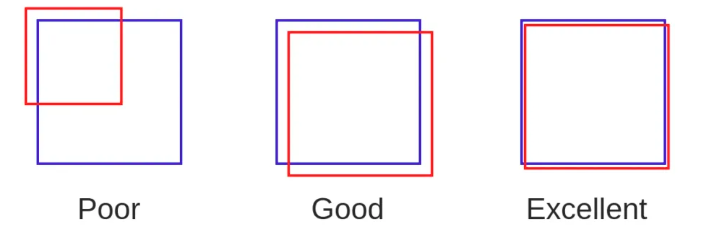

VOCdevkit/VOC2012/JPEGImages/2012_003460.jpg


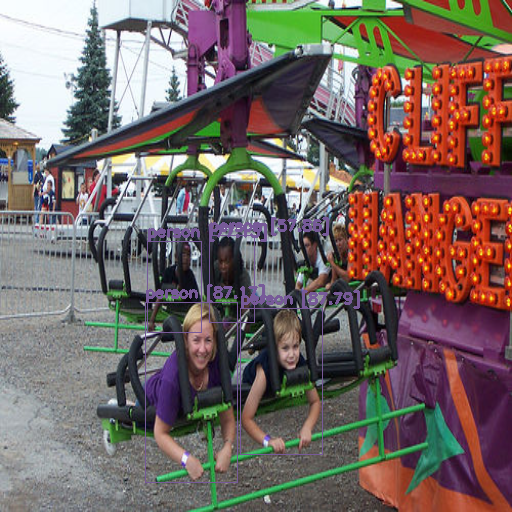

DETECTED {'person': [[204, 152, 248, 209], [143, 156, 196, 215], [141, 196, 231, 313], [234, 200, 314, 295]]}
GROUND TRUTH {'person': [[106, 200, 233, 310], [227, 202, 313, 296]]}


In [ ]:
# Ahora evaluemos el desempeño comparando las regiones entregadas por la red con los valores reales entregados por el
# dataset Pascal VOC

# Al llamar a predictImage() sin argumentos, se recibe un diccionario con las cajas entregadas por la red y otro con los
# valores reales del dataset.
detections, ground_truth = predictImage()
print('DETECTED', detections)
print('GROUND TRUTH', ground_truth)

In [ ]:
# Generamos una función que recibe dos bounding boxes y calcula el valor IoU.

def bb_intersection_over_union(boxA, boxB):
	# determina las coordenadas (x, y) del rectángulo de intersección
	xA = max(boxA[0], boxB[0])
	yA = max(boxA[1], boxB[1])
	xB = min(boxA[2], boxB[2])
	yB = min(boxA[3], boxB[3])
	# calcula el área del rectángulo de intersección
	interArea = max(0, xB - xA + 1) * max(0, yB - yA + 1)
	# calcula el área tanto del rectángulo de predicción como del rectángulo de referencia (ground-truth)
	boxAArea = (boxA[2] - boxA[0] + 1) * (boxA[3] - boxA[1] + 1)
	boxBArea = (boxB[2] - boxB[0] + 1) * (boxB[3] - boxB[1] + 1)
	# calcula la intersección sobre la unión dividiendo el área de intersección
	# entre la suma de las áreas de predicción y referencia, menos el área de intersección
	# areas - the interesection area
	iou = interArea / float(boxAArea + boxBArea - interArea)
	# devuelve el valor de intersección sobre unión
	return iou

In [ ]:
# Definimos una función que itere sobre las clases en común entre el ground truth y las predicciones
# para que calcule el IoU entre cada uno de los objetos encontrados por clase

def evaluate(gt, preds):
  # Obtiene las clases presentes en las ground truths y las predicciones
    gt_classes = set(gt.keys())
    pred_classes = set(preds.keys())
     # Obtiene las clases comunes entre las ground truths y las predicciones
    common_classes = gt_classes.intersection(pred_classes)
    # Verifica si hay clases comunes
    if len(common_classes) > 0:
       # Itera sobre las clases comunes
        for classname in common_classes:
          # Itera sobre los objetos de la ground truth de la clase actual
            for i, gt_obj in enumerate(gt[classname]):
               # Itera sobre los objetos predichos de la clase actual
                for j, pred_obj in enumerate(preds[classname]):
                   # Calcula el IoU entre el objeto de la ground truth y el objeto predicho
                    iou = bb_intersection_over_union(gt_obj, pred_obj)
                    # Imprime el valor del IoU
                    print(f'GT {classname} {i} - PRED {classname} {j} IoU = {iou}')
    else:
        return None

379 500


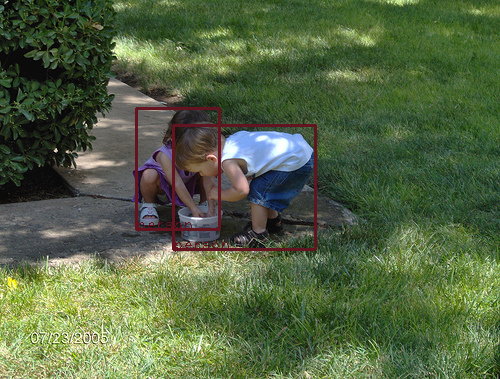

{'person': [[173, 125, 315, 249], [136, 108, 219, 229]]}


In [ ]:
# Obtengamos una imagen al azar del dataset Pascal VOC y guardaremos su ubicación en la variable test_image_path
# y las cajas a detectar en la variable ground_truth
test_image_path, ground_truth = get_random_img_voc(True)
print(ground_truth)

VOCdevkit/VOC2012/JPEGImages/2008_000878.jpg


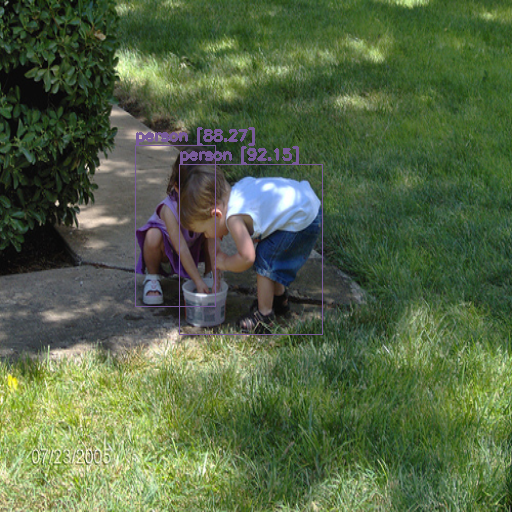

{'person': [[131, 107, 209, 226], [174, 121, 314, 247]]}

In [ ]:
# Ahora predecimos los objetos dentro de la imagen con YOLO y lo guardamos en la variable predictions
predictions, _ = predictImage(test_image_path, threshold=0.5)
predictions

## Actividad 2:

Ejecute las celdas anteriores hasta que encuentre una imagen donde hayan clases en común y calcule el IoU usando la función `evaluate`.

- ¿Qué tan buenas son las detecciones?
- ¿Se correlacionan con el IoU obtenido?
- ¿Qué es lo que penaliza el IoU?

In [ ]:
evaluate(ground_truth, predictions)

GT person 0 - PRED person 0 IoU = 0.16004410330350707
GT person 0 - PRED person 1 IoU = 0.9405607679375237
GT person 1 - PRED person 0 IoU = 0.8062625892693646
GT person 1 - PRED person 1 IoU = 0.2166717082234994
